# WGAN State Farm

This is the code corresponding to my blog post ["Generative Adversarial Networks (GANs) for Beginners:
Generating Images of Distracted Drivers."](https://medium.com/@zachmonge) Many parts of this code were modeled from the fastai course. This notebook was ran on a 15" Windows Surface Book2 with a NVIDIA GeForce GTX 1060 GPU. <br><br>

The GAN used here is specifically a Wasserstein GAN. See the [Wasserstein GAN paper](https://arxiv.org/abs/1701.07875) for more details. The data used is from [Kaggle's State Farm Distracted Driver Detection competition](https://www.kaggle.com/c/state-farm-distracted-driver-detection). If you would like to replicate this notebook, the data is available on the linked site.

In [3]:
# Importing packages

%matplotlib inline
%reload_ext autoreload
%autoreload 2

from fastai.conv_learner import *
from fastai.dataset import *
import gzip

C:\Users\zachm\Anaconda3\envs\fastai\lib\site-packages\sklearn\ensemble\weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


## Loading in the data

First lets load in the data. For this notebook I am using all of the training images __and also the test images (I just copied and pasted them into the train directory)__. I tried just using the training data, but the GAN was not working. I needed a lot more data, which I got from the test set.

In [4]:
#Path to data
PATH = Path('data/state-farm-distracted-driver-detection/imgs')
IMG_PATH = PATH/'train'
CSV_PATH = PATH/'files.csv'

In [5]:
# The file names of the images
files = PATH.glob('train/**/*.jpg')

In [6]:
# Creating a CSV for the file names
with CSV_PATH.open('w') as fo:
    for f in files:
        fo.write(f'{f.relative_to(PATH)},0\n')

In [7]:
# Specifictions for the model
# bs = batch size
# sz = size of images
# nz = size of noise
bs,sz,nz = 64,64,100

In [9]:
# Loading in the data and normalizing it. 
# For image transoformations using mean and standard deviations of Inception model. 
# The mean and standard deviations of all three channels are 0.5

tfms = tfms_from_stats(inception_stats,sz)
md=ImageClassifierData.from_csv(PATH,'',CSV_PATH,tfms=tfms,continuous=True,skip_header=False,bs=128)

In [10]:
# Resizing the images so they are 64x64 pixels
md=md.resize(128)

Lets look at one example image

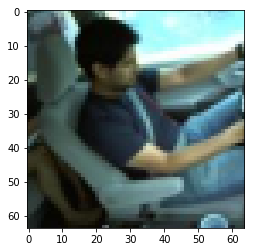

In [24]:
x, _ = next(iter(md.val_dl))
plt.imshow(md.trn_ds.denorm(x)[0])

## Creating the model

Now we need to create a discriminator and a generator. The discriminator will take a picture and basically break it down to one value. The generator will take noise and generate an image.

### The Discriminator

The discriminator's job is to take an image and try to decide if it is real or fake (i.e., discriminate between fake and real images). We basically take an image and reduce it down to one value, which is the loss. This is esentially achieved by putting it through a whole bunch of convolution layers. More specifically, for the discriminator, we put it through ConvLayer (consists of a covolution layer, batch norm, and leaky ReLU), have the option of adding extra ConvLayers, and then basically put the "image" through ConvLayers with a stride of 2 until it gets to the point that it is a 4x4 grid (also double the number of filters for each iteration). At that point, have one last convolution layer that reduces the grid and nubmer of filters down to one value. This is the loss.

In [13]:
class ConvLayer(nn.Module):
    def __init__(self, ni, no, ks, stride=1, pad=None, bn=True):
        super().__init__()
        if pad is None: pad = ks//2//stride
        self.conv = nn.Conv2d(in_channels=ni, out_channels=no, kernel_size=ks, 
                              stride=stride,padding=pad)
        self.bn = nn.BatchNorm2d(no) if bn else None
        self.relu = nn.LeakyReLU(0.2,inplace=True)
        
    def forward(self, x):
        x = self.relu(self.conv(x))
        return self.bn(x) if self.bn else x

In [26]:
class GAN_D(nn.Module):
    def __init__(self, nc, nf, isize, n_extra_layers=0):
        super().__init__()
        
        #Note: isize must be divisible by 16
        
        # Putting through a ConvLayer
        self.init_conv = ConvLayer(nc, nf, ks=4, stride=2, bn=False)
        c_isize, c_nf = isize//2, nf
        
        # Extra layers
        self.extra = nn.Sequential(*[ConvLayer(c_nf, c_nf, 3, 1) 
                                     for t in range(n_extra_layers)])
        
        # Now lets create layers that will make the "image" size a 4 by 4 grid
        p_layers = []
        while c_isize > 4:
            p_layers.append(ConvLayer(c_nf, c_nf*2, ks=4, stride=2))
            c_isize //= 2; c_nf *= 2
        
        # Now putting all of the layers into a sequential
        self.pyramid = nn.Sequential(*p_layers)
        
        # The very last conv is going to get just one output, which is the loss
        self.final = nn.Conv2d(c_nf, 1, kernel_size=4, padding=0, bias=False)
            
        
    def forward(self, input):
        x = self.init_conv(input)
        x = self.extra(x)
        x = self.pyramid(x)
        x = self.final(x)
        return x.mean(0).view(1)

### The Generator

Now creating the generator. The structure of the generator is similar to the discriminator but instead of downsampling the image, we upsample the image with transposed convolutions. We basically take a tensor of noise and upsample it until it is the size of the image. More specifically we put the noise through a DeconvLayer (consists of a transposed convolution layer, batch norm, and ReLU), put it through several more DeconvLayers until it is the image size (while is this happening halve the number of filters during each iteration), and  add extra DeconvLayers if specififed. Lastly, put it through one more transposed convolution withe the output being 3 channels.

In [15]:
class DeconvLayer(nn.Module):
    def __init__(self, ni, no, ks, stride, pad, bn=True):
        super().__init__()
        self.conv = nn.ConvTranspose2d(ni, no, ks, stride, padding=pad, bias=False)
        self.bn = nn.BatchNorm2d(no)
        self.relu = nn.ReLU(inplace=True)
        
    def forward(self, input): 
        x=self.relu(self.conv(input))
        return self.bn(x) if self.bn else x

In [16]:
class GAN_G(nn.Module):
    def __init__(self, nc, nz, nf, isize, n_extra_layers=0):
        super().__init__()
        
        
        nf_i, nf_t = nf//2, 4
        
        # Determining the number of filters to create in the first DeconvLayer.
        # This number is nf_i
        while nf_t != isize: nf_t*=2; nf_i*=2
            
        # Put through first DeconvLayer
        layers = [DeconvLayer(nz, nf_i, 4, 1, 0)]
        
        # Upsampling the "image" until it is the specified size
        csize = 4
        while csize < isize//2:
            layers.append(DeconvLayer(nf_i, nf_i//2, 4, 2, 1))
            csize *= 2; nf_i //= 2
        
        # Extra layers
        layers += [DeconvLayer(nf_i, nf_i, 3, 1, 1) for t in range(n_extra_layers)]
        
        # Taking it down to three channels
        layers.append(nn.ConvTranspose2d(nf_i, nc, 4, 2, 1, bias=False))
        
        #Putting all the layers together
        self.features = nn.Sequential(*layers)
        
    def forward(self, input):
        return torch.tanh(self.features(input))
        

### Specifying model attributes

In [27]:
netD = GAN_D(nc=3, nf=64, isize=sz, n_extra_layers=1).cuda()
netG = GAN_G(nc=3, nz=nz, nf=64, isize=sz, n_extra_layers=1).cuda()

In [28]:
# Creating nosie function

def create_noise(b): return V(torch.zeros(b,nz,1,1).normal_(0,1))

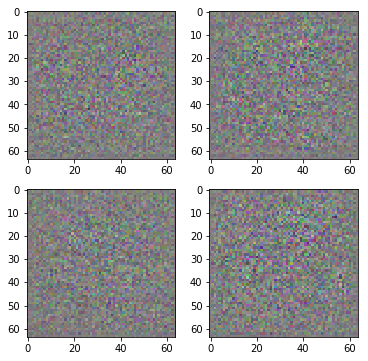

In [29]:
# Example noise

preds = netG(create_noise(4))
preds_im=md.trn_ds.denorm(preds)

fig, axes = plt.subplots(2,2, figsize=(6,6))
for i,ax in enumerate(axes.flat): ax.imshow(preds_im[i])

## Training

With the training loop first set both the netD and netG into train mode. First, will train the discriminator. Before the very first image generation, will train the discriminator 100 iterations (will also have the option to do this for the first 25 image generations). <br><br>


Discriminator training: First, set all of the parameters between -0.01 and 0.01. Setting the parameters between these values is an assumption of the [Wasserstein GAN](https://arxiv.org/abs/1701.07875). Take a batch of the real images and run the data through the discriminator; this is the real_loss. Then, create noise that is the size of a mini-batch and run through the discriminator; this is the fake loss. Then, zero the gradients of the discrimnator. Calculate the loss, which is the real loss minus the fake loss. Backpropagate to calculate the gradients and update the weights.<br><br>

Generator training: Set the generator to trainable and the discriminator to non-trainable. Zero the gradients of the generator. Put a mini-batch of noise through the generator and put that through the discriminator; this is the generator loss. Backpropagate to calculate the gradients and updates the weights

In [34]:
# For the optimizer use RMSprop as specificed in the Wasserstein GAN paper
optimizerD = optim.RMSprop(netD.parameters(), lr=1e-4)
optimizerG = optim.RMSprop(netG.parameters(), lr=1e-4)

The training loop below

In [31]:
def train(ninter, first=True):
    gen_iterations = 0 # Image generation counter
    for epoch in trange(ninter):
        netD.train(); netG.train() #Set nets to training model
        data_iter = iter(md.trn_dl) # Making the data iterable
        i,n = 0, len(md.trn_dl)
        with tqdm(total=n) as pbar:
            while i<n:
                # Setting the discriminator to trainable but not the generator
                set_trainable(netD, True)
                set_trainable(netG, False)
                
                # Specifiying how many iterations of the discriminator to go through
                d_iters = 100 if (first and (gen_iterations < 25) or (gen_iterations % 500 == 0)) else 5
                j = 0
                while (j < d_iters) and (i < n):
                    j += 1; i += 1
                    for p in netD.parameters(): p.data.clamp_(-0.01, 0.01) # Putting values between -0.01 and 0.01
                    real = V(next(data_iter)[0]) # Grabbing mini-batch of data
                    real_loss = netD(real) # Calculating the loss for the real data
                    fake = netG(V(create_noise(real.size(0))))# Generating fake data
                    fake_loss = netD(fake.data) # Calculating the loss for the fake data
                    netD.zero_grad() # Zero the gradients
                    lossD = real_loss - fake_loss # Calculating discriminator loss
                    lossD.backward() # Calculating the gradients
                    optimizerD.step() # Updating the weights
                    pbar.update()
                
                # Now lets train the generator
                set_trainable(netD, False)
                set_trainable(netG, True)
                netG.zero_grad() # Zero the graidents
                
                # Put noise through the generator and calculate the discriminator loss
                lossG = netD(netG(create_noise(bs))).mean(0).view(1)
                
                lossG.backward() # Calculating the gradients
                optimizerG.step() # Updating the weights
                gen_iterations += 1
        
        print(f'LossD{to_np(lossD)}; LossG{to_np(lossG)};' 
              f'Loss_D_real{to_np(real_loss)}; Loss_D_fake{to_np(fake_loss)}')

In [22]:
# This funciton just displays example generated images. This is copied directly from the fastai course script
def gallery(x, nc=3):
    n,h,w,c = x.shape
    nr = n//nc
    assert n == nr*nc
    return (x.reshape(nr, nc, h, w, c)
              .swapaxes(1,2)
              .reshape(h*nr, w*nc, c))

Now we can start training! I trained this probably for a lot longer than was necessary but I had it just running in the background while I worked on other projects.

In [20]:
train(1,False)

100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [02:29<00:00,  4.38it/s]
LossD[-1.47367]; LossG[0.69662];Loss_D_real[-0.78998]; Loss_D_fake[0.68369]
100%|███████████████████████████████████████████████████████████████████████████████████| 1/1 [02:29<00:00, 149.64s/it]

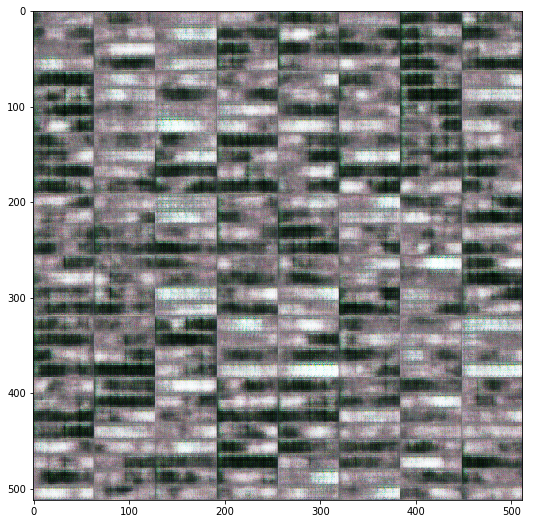

In [21]:
netD.eval(); netG.eval()
fake=netG(create_noise(bs)).data.cpu()
fake_im = np.clip(md.trn_ds.denorm(fake),0,1)

plt.figure(figsize=(9,9))
plt.imshow(gallery(fake_im, 8));

In [22]:
train(20,False)

100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [02:38<00:00,  3.96it/s]
LossD[-1.48733]; LossG[0.70495];Loss_D_real[-0.79738]; Loss_D_fake[0.68995]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [02:39<00:00,  4.37it/s]
LossD[-1.48592]; LossG[0.69621];Loss_D_real[-0.80213]; Loss_D_fake[0.68378]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [02:33<00:00,  4.31it/s]
LossD[-1.4877]; LossG[0.69515];Loss_D_real[-0.80499]; Loss_D_fake[0.68271]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [05:21<00:00,  2.01s/it]
LossD[-1.48814]; LossG[0.69581];Loss_D_real[-0.80601]; Loss_D_fake[0.68212]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [13:15<00:00,  1.02s/it]
LossD[-1.48837]; LossG[0.69693];Loss_D_real[-0.80576]; Loss_D_fake[0.68261]
100%|████████████████

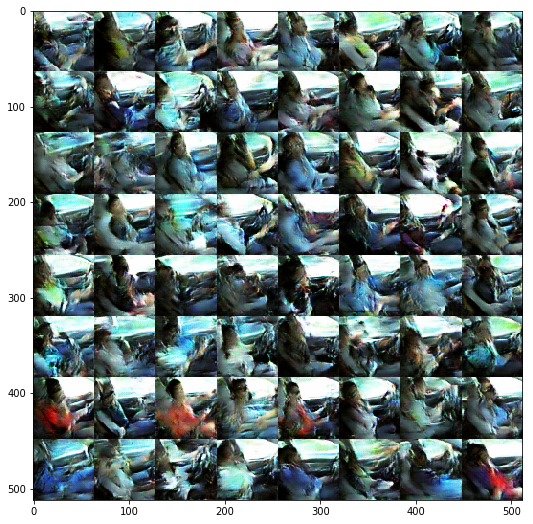

In [23]:
netD.eval(); netG.eval()
fake=netG(create_noise(bs)).data.cpu()
fake_im = np.clip(md.trn_ds.denorm(fake),0,1)

plt.figure(figsize=(9,9))
plt.imshow(gallery(fake_im, 8));

In [24]:
train(20,False)

100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [03:11<00:00,  3.42it/s]
LossD[-1.061]; LossG[0.50368];Loss_D_real[-0.4023]; Loss_D_fake[0.65871]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [03:13<00:00,  3.52it/s]
LossD[-1.11723]; LossG[0.53258];Loss_D_real[-0.5]; Loss_D_fake[0.61723]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [03:13<00:00,  3.46it/s]
LossD[-1.09204]; LossG[0.63039];Loss_D_real[-0.59386]; Loss_D_fake[0.49819]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [03:12<00:00,  3.46it/s]
LossD[-1.11677]; LossG[0.60374];Loss_D_real[-0.58064]; Loss_D_fake[0.53613]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [03:10<00:00,  3.50it/s]
LossD[-0.96374]; LossG[0.43384];Loss_D_real[-0.31642]; Loss_D_fake[0.64732]
100%|██████████████████████

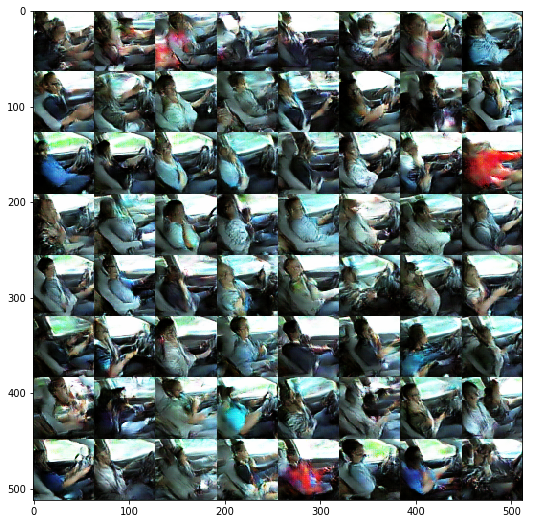

In [25]:
netD.eval(); netG.eval()
fake=netG(create_noise(bs)).data.cpu()
fake_im = np.clip(md.trn_ds.denorm(fake),0,1)

plt.figure(figsize=(9,9))
plt.imshow(gallery(fake_im, 8));

In [26]:
train(20,False)

100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [09:38<00:00,  1.61it/s]
LossD[-0.91231]; LossG[0.43574];Loss_D_real[-0.32709]; Loss_D_fake[0.58521]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [10:16<00:00,  1.02s/it]
LossD[-0.65974]; LossG[0.21926];Loss_D_real[-0.05192]; Loss_D_fake[0.60783]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [10:14<00:00,  1.01it/s]
LossD[-0.89565]; LossG[0.60833];Loss_D_real[-0.54906]; Loss_D_fake[0.34659]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [10:00<00:00,  1.05it/s]
LossD[-0.96391]; LossG[0.56306];Loss_D_real[-0.50545]; Loss_D_fake[0.45846]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [09:55<00:00,  1.13it/s]
LossD[-0.80842]; LossG[0.5967];Loss_D_real[-0.52243]; Loss_D_fake[0.28599]
100%|████████████████

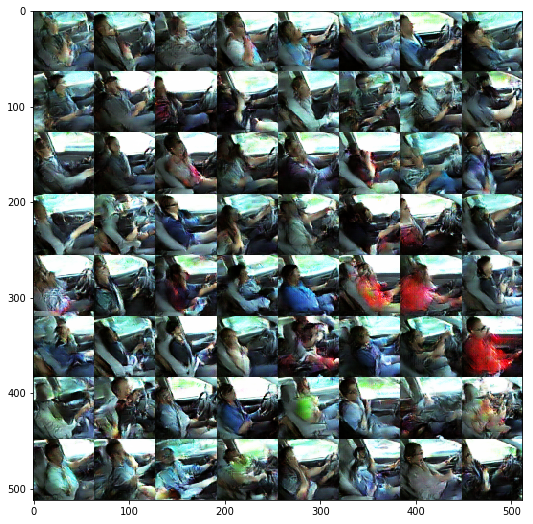

In [27]:
netD.eval(); netG.eval()
fake=netG(create_noise(bs)).data.cpu()
fake_im = np.clip(md.trn_ds.denorm(fake),0,1)

plt.figure(figsize=(9,9))
plt.imshow(gallery(fake_im, 8));

In [28]:
train(20,False)

100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [08:46<00:00,  1.01s/it]
LossD[-0.89207]; LossG[0.53429];Loss_D_real[-0.52327]; Loss_D_fake[0.3688]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [08:41<00:00,  1.01s/it]
LossD[-0.86771]; LossG[0.54362];Loss_D_real[-0.5241]; Loss_D_fake[0.34362]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [08:39<00:00,  1.01s/it]
LossD[-0.59247]; LossG[0.18576];Loss_D_real[-0.043]; Loss_D_fake[0.54948]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [08:45<00:00,  1.02s/it]
LossD[-0.83869]; LossG[0.35717];Loss_D_real[-0.28819]; Loss_D_fake[0.5505]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [08:41<00:00,  1.03s/it]
LossD[-0.76003]; LossG[0.57353];Loss_D_real[-0.54422]; Loss_D_fake[0.21582]
100%|████████████████████

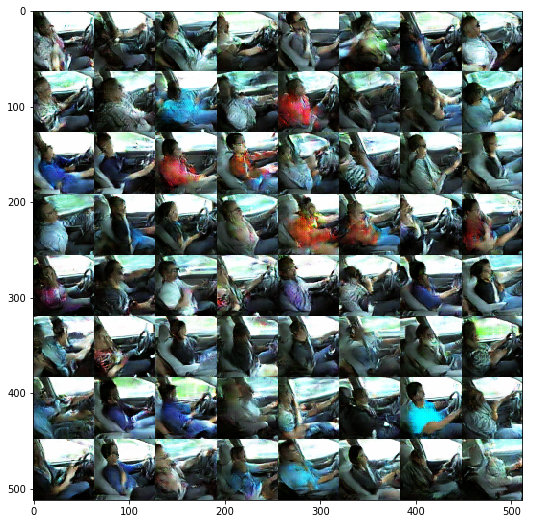

In [29]:
netD.eval(); netG.eval()
fake=netG(create_noise(bs)).data.cpu()
fake_im = np.clip(md.trn_ds.denorm(fake),0,1)

plt.figure(figsize=(9,9))
plt.imshow(gallery(fake_im, 8));

In [30]:
train(20,False)

100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [08:32<00:00,  1.63it/s]
LossD[-0.85611]; LossG[0.3849];Loss_D_real[-0.37499]; Loss_D_fake[0.48112]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [08:01<00:00,  1.50it/s]
LossD[-0.82926]; LossG[0.36189];Loss_D_real[-0.36913]; Loss_D_fake[0.46013]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [07:56<00:00,  1.06it/s]
LossD[-0.84624]; LossG[0.36371];Loss_D_real[-0.36145]; Loss_D_fake[0.48479]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [07:58<00:00,  1.45it/s]
LossD[-0.66589]; LossG[0.56877];Loss_D_real[-0.53062]; Loss_D_fake[0.13527]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [07:55<00:00,  1.52it/s]
LossD[-0.85028]; LossG[0.46539];Loss_D_real[-0.42654]; Loss_D_fake[0.42375]
100%|████████████████

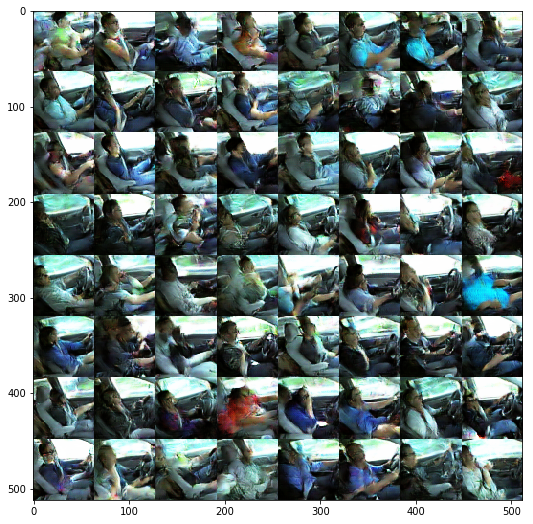

In [35]:
netD.eval(); netG.eval()
fake=netG(create_noise(bs)).data.cpu()
fake_im = np.clip(md.trn_ds.denorm(fake),0,1)

plt.figure(figsize=(9,9))
plt.imshow(gallery(fake_im, 8));

In [34]:
train(20,False)

100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [02:36<00:00,  4.07it/s]
LossD[-0.69308]; LossG[0.27187];Loss_D_real[-0.17003]; Loss_D_fake[0.52305]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [03:20<00:00,  3.09it/s]
LossD[-0.72351]; LossG[0.49825];Loss_D_real[-0.46757]; Loss_D_fake[0.25595]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [03:32<00:00,  3.12it/s]
LossD[-0.80193]; LossG[0.47313];Loss_D_real[-0.46531]; Loss_D_fake[0.33662]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [05:54<00:00,  1.00s/it]
LossD[-0.80614]; LossG[0.30795];Loss_D_real[-0.34806]; Loss_D_fake[0.45808]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [06:27<00:00,  3.49it/s]
LossD[-0.79179]; LossG[0.41471];Loss_D_real[-0.4051]; Loss_D_fake[0.38669]
100%|████████████████

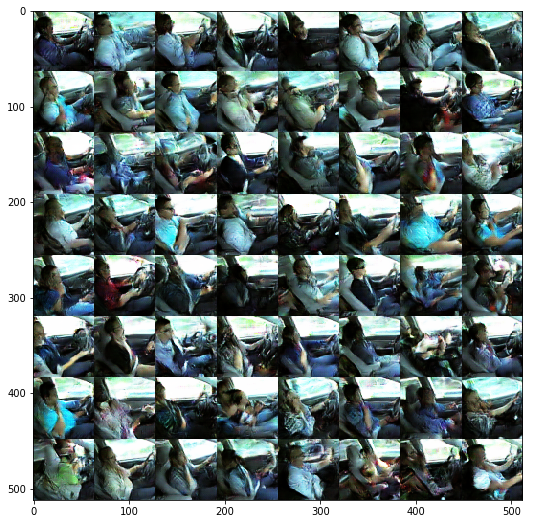

In [31]:
netD.eval(); netG.eval()
fake=netG(create_noise(bs)).data.cpu()
fake_im = np.clip(md.trn_ds.denorm(fake),0,1)

plt.figure(figsize=(9,9))
plt.imshow(gallery(fake_im, 8));

In [32]:
train(20,False)

100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [03:09<00:00,  3.61it/s]
LossD[-0.80243]; LossG[0.42925];Loss_D_real[-0.34539]; Loss_D_fake[0.45704]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [03:10<00:00,  3.52it/s]
LossD[-0.8112]; LossG[0.24905];Loss_D_real[-0.30485]; Loss_D_fake[0.50635]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [03:11<00:00,  3.47it/s]
LossD[-0.70252]; LossG[0.51985];Loss_D_real[-0.45911]; Loss_D_fake[0.2434]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [03:13<00:00,  3.49it/s]
LossD[-0.67776]; LossG[0.43965];Loss_D_real[-0.44754]; Loss_D_fake[0.23022]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [03:10<00:00,  3.45it/s]
LossD[-0.77843]; LossG[0.48994];Loss_D_real[-0.47316]; Loss_D_fake[0.30527]
100%|█████████████████

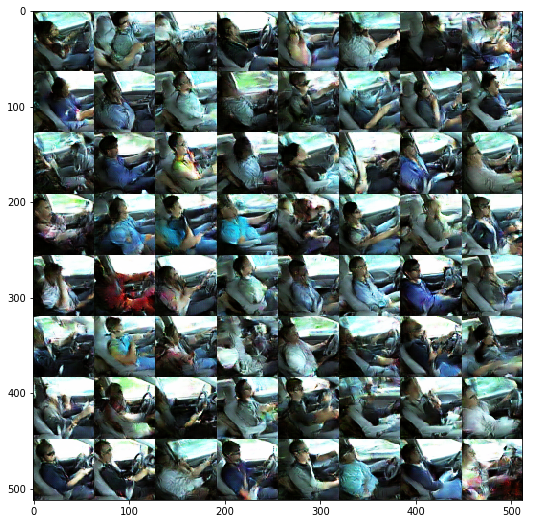

In [33]:
netD.eval(); netG.eval()
fake=netG(create_noise(bs)).data.cpu()
fake_im = np.clip(md.trn_ds.denorm(fake),0,1)

plt.figure(figsize=(9,9))
plt.imshow(gallery(fake_im, 8));

In [36]:
train(20,False)

100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [02:51<00:00,  4.39it/s]
LossD[-0.84949]; LossG[0.50786];Loss_D_real[-0.45534]; Loss_D_fake[0.39415]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [02:31<00:00,  4.51it/s]
LossD[-0.83304]; LossG[0.53081];Loss_D_real[-0.50441]; Loss_D_fake[0.32863]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [02:32<00:00,  4.40it/s]
LossD[-0.54762]; LossG[0.21735];Loss_D_real[-0.00295]; Loss_D_fake[0.54466]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [02:52<00:00,  3.62it/s]
LossD[-0.88844]; LossG[0.38872];Loss_D_real[-0.40325]; Loss_D_fake[0.48519]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [03:00<00:00,  3.73it/s]
LossD[-0.80869]; LossG[0.3456];Loss_D_real[-0.31106]; Loss_D_fake[0.49763]
100%|████████████████

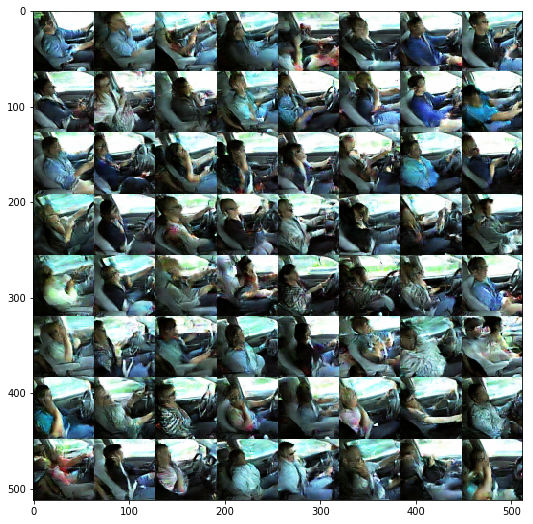

In [37]:
netD.eval(); netG.eval()
fake=netG(create_noise(bs)).data.cpu()
fake_im = np.clip(md.trn_ds.denorm(fake),0,1)

plt.figure(figsize=(9,9))
plt.imshow(gallery(fake_im, 8));

In [39]:
train(20,False)

100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [02:30<00:00,  3.25it/s]
LossD[-0.82434]; LossG[0.52167];Loss_D_real[-0.46734]; Loss_D_fake[0.357]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [08:32<00:00,  2.97it/s]
LossD[-0.87382]; LossG[0.38264];Loss_D_real[-0.35397]; Loss_D_fake[0.51985]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [02:41<00:00,  4.66it/s]
LossD[-0.84237]; LossG[0.50529];Loss_D_real[-0.43812]; Loss_D_fake[0.40424]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [02:27<00:00,  4.70it/s]
LossD[-0.74709]; LossG[0.55087];Loss_D_real[-0.48569]; Loss_D_fake[0.26141]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [02:31<00:00,  4.70it/s]
LossD[-0.7597]; LossG[0.49825];Loss_D_real[-0.50379]; Loss_D_fake[0.2559]
100%|███████████████████

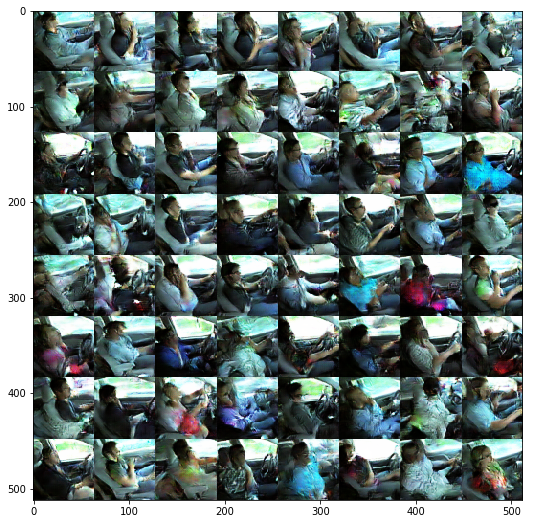

In [38]:
netD.eval(); netG.eval()
fake=netG(create_noise(bs)).data.cpu()
fake_im = np.clip(md.trn_ds.denorm(fake),0,1)

plt.figure(figsize=(9,9))
plt.imshow(gallery(fake_im, 8));

In [42]:
train(20,False)

100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [03:51<00:00,  4.45it/s]
LossD[-0.83233]; LossG[0.38471];Loss_D_real[-0.34137]; Loss_D_fake[0.49096]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [02:39<00:00,  3.96it/s]
LossD[-0.77159]; LossG[0.11041];Loss_D_real[-0.28625]; Loss_D_fake[0.48534]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [02:55<00:00,  3.78it/s]
LossD[-0.7244]; LossG[0.24206];Loss_D_real[-0.23069]; Loss_D_fake[0.4937]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [02:58<00:00,  3.34it/s]
LossD[-0.85202]; LossG[0.42926];Loss_D_real[-0.41249]; Loss_D_fake[0.43952]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [03:42<00:00,  2.96it/s]
LossD[-0.88781]; LossG[0.47547];Loss_D_real[-0.46199]; Loss_D_fake[0.42583]
100%|█████████████████

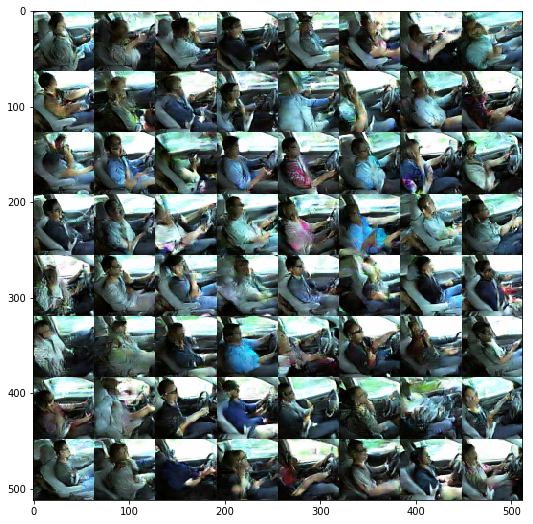

In [41]:
netD.eval(); netG.eval()
fake=netG(create_noise(bs)).data.cpu()
fake_im = np.clip(md.trn_ds.denorm(fake),0,1)

plt.figure(figsize=(9,9))
plt.imshow(gallery(fake_im, 8));

In [40]:
train(20,False)

100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [04:04<00:00,  4.00it/s]
LossD[-0.798]; LossG[0.35886];Loss_D_real[-0.29494]; Loss_D_fake[0.50306]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [02:51<00:00,  3.50it/s]
LossD[-0.83328]; LossG[0.42194];Loss_D_real[-0.40135]; Loss_D_fake[0.43193]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [05:11<00:00,  2.97it/s]
LossD[-0.83069]; LossG[0.47847];Loss_D_real[-0.48376]; Loss_D_fake[0.34693]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [03:47<00:00,  3.00it/s]
LossD[-0.87961]; LossG[0.40122];Loss_D_real[-0.40806]; Loss_D_fake[0.47155]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [03:45<00:00,  2.99it/s]
LossD[-0.8001]; LossG[0.29452];Loss_D_real[-0.2647]; Loss_D_fake[0.5354]
100%|████████████████████

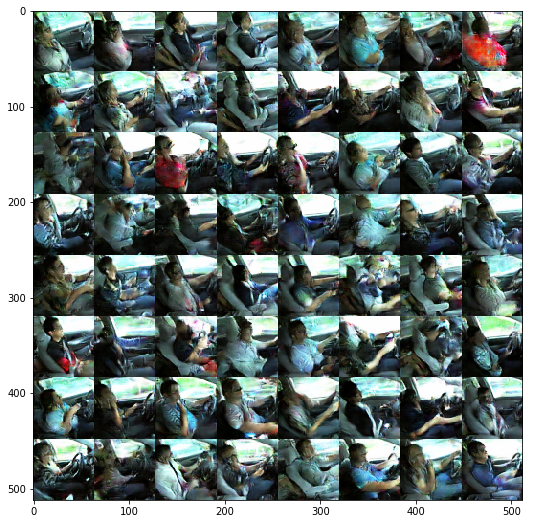

In [43]:
netD.eval(); netG.eval()
fake=netG(create_noise(bs)).data.cpu()
fake_im = np.clip(md.trn_ds.denorm(fake),0,1)

plt.figure(figsize=(9,9))
plt.imshow(gallery(fake_im, 8));

In [47]:
train(20,False)

100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [03:37<00:00,  3.91it/s]
LossD[-0.82291]; LossG[0.53367];Loss_D_real[-0.49904]; Loss_D_fake[0.32387]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [02:49<00:00,  3.93it/s]
LossD[-0.76387]; LossG[0.17554];Loss_D_real[-0.18068]; Loss_D_fake[0.58319]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [09:26<00:00,  1.93s/it]
LossD[-0.87611]; LossG[0.51093];Loss_D_real[-0.46281]; Loss_D_fake[0.4133]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [12:32<00:00,  1.11s/it]
LossD[-0.90292]; LossG[0.56273];Loss_D_real[-0.53026]; Loss_D_fake[0.37266]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [12:31<00:00,  1.01s/it]
LossD[-0.92465]; LossG[0.45282];Loss_D_real[-0.4109]; Loss_D_fake[0.51374]
100%|█████████████████

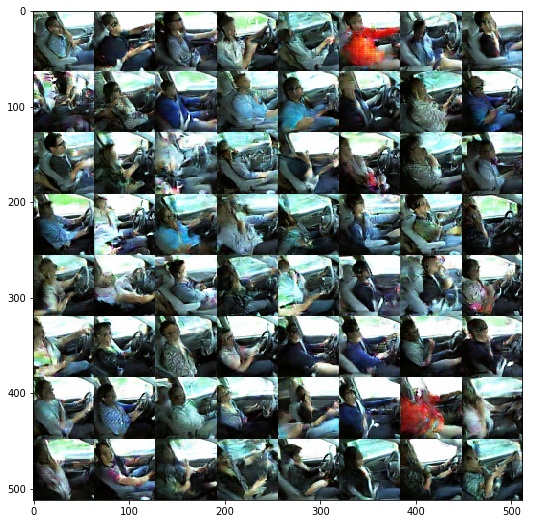

In [45]:
netD.eval(); netG.eval()
fake=netG(create_noise(bs)).data.cpu()
fake_im = np.clip(md.trn_ds.denorm(fake),0,1)

plt.figure(figsize=(9,9))
plt.imshow(gallery(fake_im, 8));

In [46]:
train(20,False)

100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [02:53<00:00,  2.42it/s]
LossD[-0.87725]; LossG[0.5208];Loss_D_real[-0.43478]; Loss_D_fake[0.44247]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [10:22<00:00,  1.56it/s]
LossD[-0.77258]; LossG[0.30273];Loss_D_real[-0.21631]; Loss_D_fake[0.55626]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [09:05<00:00,  1.50it/s]
LossD[-0.8626]; LossG[0.4265];Loss_D_real[-0.39446]; Loss_D_fake[0.46813]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [02:56<00:00,  4.71it/s]
LossD[-0.93234]; LossG[0.48048];Loss_D_real[-0.45306]; Loss_D_fake[0.47928]
100%|████████████████████████████████████████████████████████████████████████████████| 639/639 [02:30<00:00,  4.60it/s]
LossD[-0.83869]; LossG[0.30319];Loss_D_real[-0.30614]; Loss_D_fake[0.53256]
100%|██████████████████

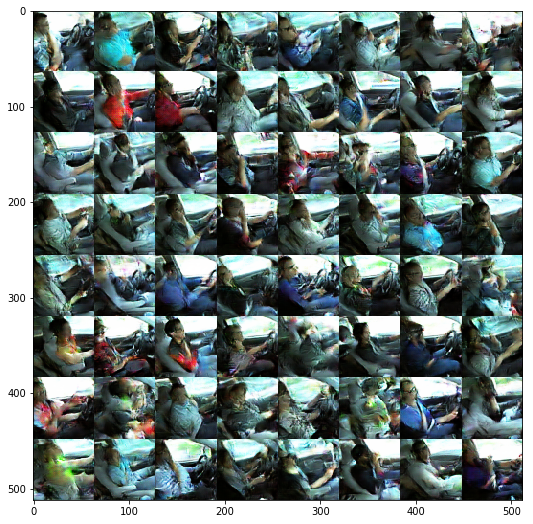

In [44]:
netD.eval(); netG.eval()
fake=netG(create_noise(bs)).data.cpu()
fake_im = np.clip(md.trn_ds.denorm(fake),0,1)

plt.figure(figsize=(9,9))
plt.imshow(gallery(fake_im, 8));

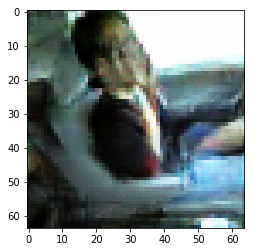

In [67]:
plt.imshow(fake_im[7])